In [1]:
"""
This notebook is to visualize the variance across reconstruction using different token counts.
It also finds images with the highest and lowest LPIPS variance for each token count
and plots their 8 stochastic reconstructions.
"""

'\nThis notebook is to visualize the variance across reconstruction using different token counts.\nIt also finds images with the highest and lowest LPIPS variance for each token count\nand plots their 8 stochastic reconstructions.\n'

In [2]:
import json
import torch
import torchvision
import matplotlib.pyplot as plt


In [3]:
def plot_reconstructions(image_class_name, image_name, main_path ="/BS/data_mani_compress/work/thesis/reconstruction_imagenet_stochastic/val/",  k_values=[1,2,4,8,16,32,64,128,256]):
    stochastic_reconstructions = []
    k_values = [1,2,4,8,16,32,64,128,256]
    for i in k_values:
        path = main_path + f"reconst_{i}" + f"/{image_class_name}/{image_name}/"
        current_k_recons = []
        for j in range(8):
            # load the image from jpeg
            img = torch.tensor(torchvision.io.read_image(path+image_name+"_r"+str(j)+".JPEG")).float() / 255.0
            current_k_recons.append(img)
        stochastic_reconstructions.append(current_k_recons)

    fig, axs = plt.subplots(9, 8, figsize=(12, 12))
    for i in range(9):
        for j in range(8):
            axs[i, j].imshow(stochastic_reconstructions[i][j].permute(1, 2, 0))
            axs[i, j].axis('off')
    plt.tight_layout()
    plt.savefig(f"/BS/data_mani_compress/work/thesis/thesis/output/lpips_variance_reconstruction_{image_class_name}_{image_name}.pdf")
    plt.show()

/tmp/ipykernel_1914317/3837371588.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(torchvision.io.read_image(path+image_name+"_r"+str(j)+".JPEG")).float() / 255.0


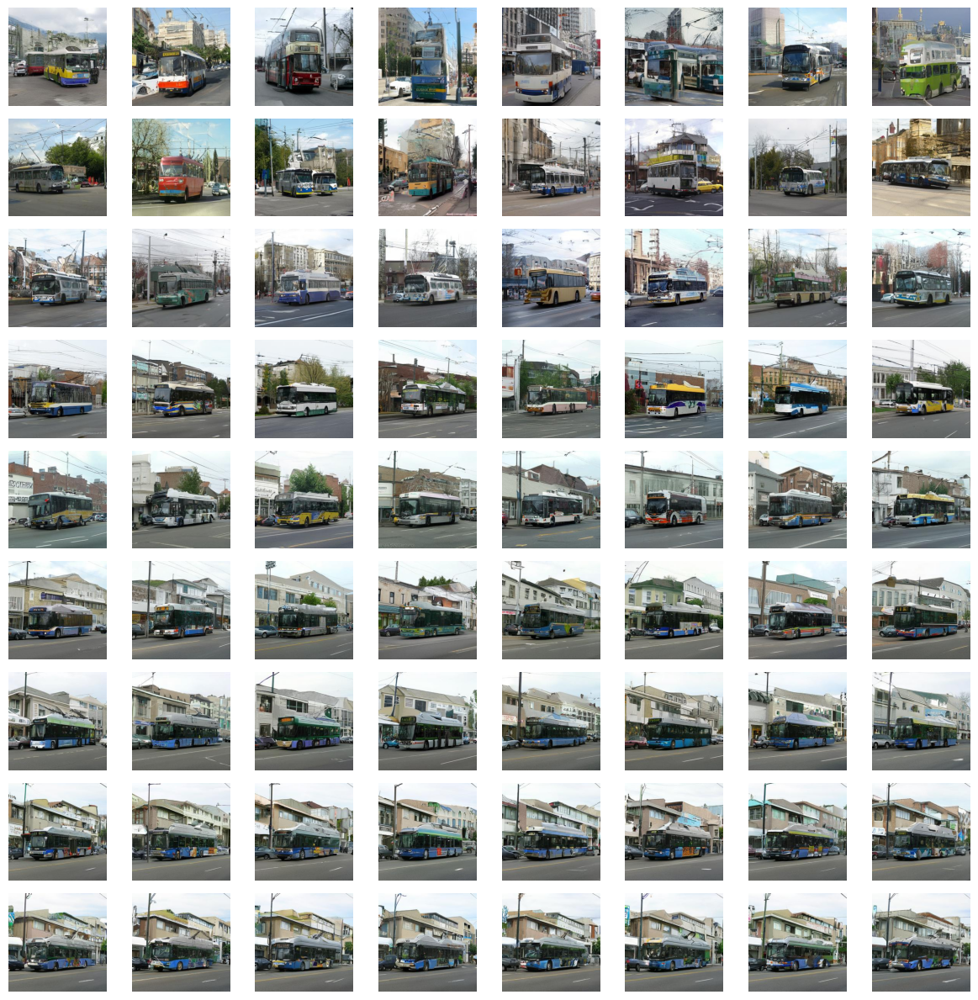

In [4]:
plot_reconstructions(
    image_class_name = "n04487081",
    image_name = "ILSVRC2012_val_00000573")

/tmp/ipykernel_1914317/3837371588.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(torchvision.io.read_image(path+image_name+"_r"+str(j)+".JPEG")).float() / 255.0


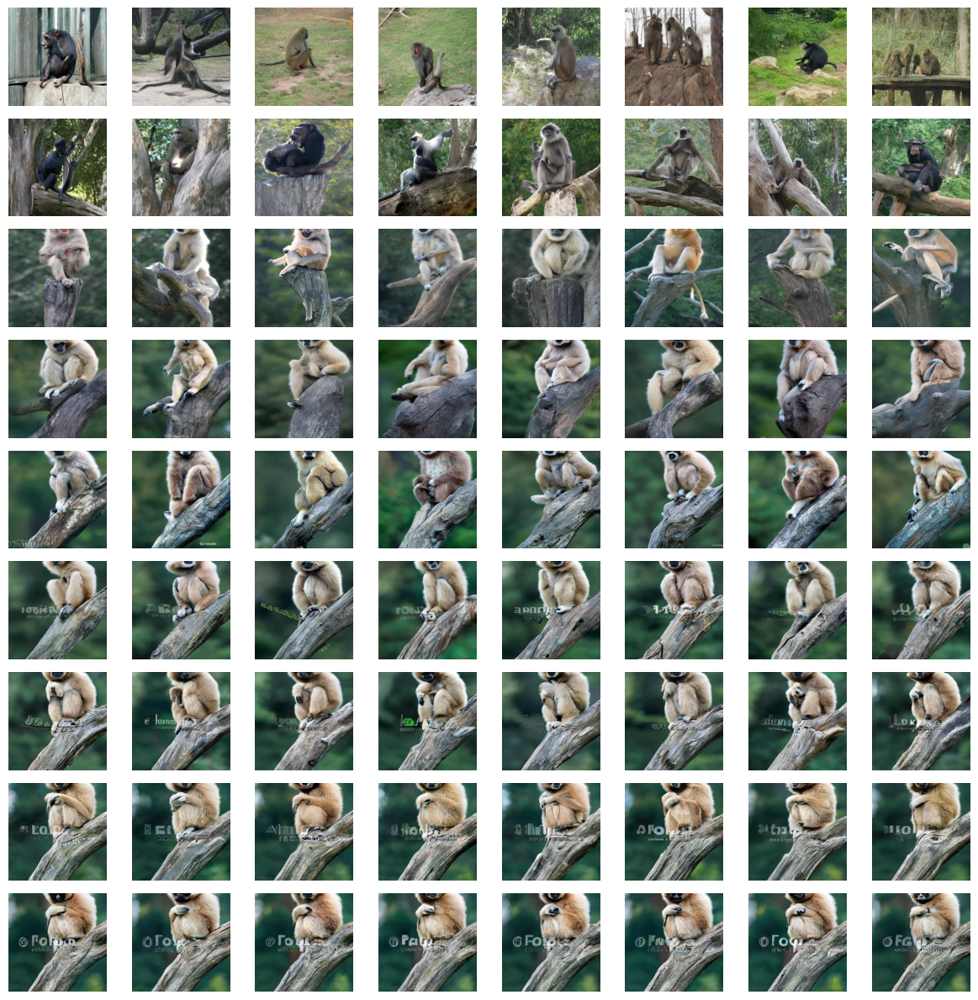

In [5]:
plot_reconstructions(
    image_class_name = "n02483362",
    image_name = "ILSVRC2012_val_00003388")

In [6]:
# Load LPIPS variance data for all token counts
k_values = [1, 2, 4, 8, 16, 32, 64, 128, 256]
variance_data_path = "/BS/data_mani_compress/work/thesis/thesis/data/datasets/LPIPS_variance_reconstructions/val/"

variance_data = {}
for k in k_values:
    with open(variance_data_path + f"reconst_{k}.json", "r") as f:
        variance_data[k] = json.load(f)

print(f"Loaded variance data for k values: {list(variance_data.keys())}")

Loaded variance data for k values: [1, 2, 4, 8, 16, 32, 64, 128, 256]


In [7]:
def get_extreme_variance_images(variance_data, k):
    """Find images with highest and lowest LPIPS variance for a given token count k."""
    data = variance_data[k]
    # Flatten: iterate over all classes and images
    all_images = []
    for class_name, images in data.items():
        for image_name, variance in images.items():
            all_images.append((class_name, image_name, variance))
    
    all_images.sort(key=lambda x: x[2])
    lowest = all_images[0]
    highest = all_images[-1]
    return {
        "highest": {"class": highest[0], "image": highest[1], "variance": highest[2]},
        "lowest": {"class": lowest[0], "image": lowest[1], "variance": lowest[2]},
    }

# Quick test
for k in k_values:
    extremes = get_extreme_variance_images(variance_data, k)
    print(f"k={k:>3d} | highest: {extremes['highest']['class']}/{extremes['highest']['image']} (var={extremes['highest']['variance']:.6f}) "
          f"| lowest: {extremes['lowest']['class']}/{extremes['lowest']['image']} (var={extremes['lowest']['variance']:.6f})")

k=  1 | highest: n02280649/ILSVRC2012_val_00020691 (var=0.859036) | lowest: n01828970/ILSVRC2012_val_00000420 (var=0.345043)
k=  2 | highest: n02256656/ILSVRC2012_val_00012124 (var=0.890189) | lowest: n02012849/ILSVRC2012_val_00001716 (var=0.317677)
k=  4 | highest: n02165456/ILSVRC2012_val_00018332 (var=0.802286) | lowest: n04409515/ILSVRC2012_val_00010812 (var=0.138890)
k=  8 | highest: n07720875/ILSVRC2012_val_00049710 (var=0.795744) | lowest: n02948072/ILSVRC2012_val_00007580 (var=0.084049)
k= 16 | highest: n04270147/ILSVRC2012_val_00013556 (var=0.775809) | lowest: n04409515/ILSVRC2012_val_00010812 (var=0.063614)
k= 32 | highest: n04116512/ILSVRC2012_val_00030821 (var=0.726490) | lowest: n02948072/ILSVRC2012_val_00007580 (var=0.034293)
k= 64 | highest: n03724870/ILSVRC2012_val_00020896 (var=0.683763) | lowest: n04270147/ILSVRC2012_val_00016601 (var=0.025030)
k=128 | highest: n03721384/ILSVRC2012_val_00018965 (var=0.616802) | lowest: n02790996/ILSVRC2012_val_00028259 (var=0.020932)


In [8]:
def plot_extreme_reconstructions(
    variance_data,
    k,
    extreme_type="highest",
    main_path="/BS/data_mani_compress/work/thesis/reconstruction_imagenet_stochastic/val/",
    n_seeds=8,
):
    """
    For a given token count k, find the image with highest/lowest variance
    and plot its n_seeds reconstructions.
    """
    extremes = get_extreme_variance_images(variance_data, k)
    info = extremes[extreme_type]
    image_class_name = info["class"]
    image_name = info["image"]

    path = main_path + f"reconst_{k}/{image_class_name}/{image_name}/"

    reconstructions = []
    for j in range(n_seeds):
        img = torch.tensor(
            torchvision.io.read_image(path + image_name + "_r" + str(j) + ".JPEG")
        ).float() / 255.0
        reconstructions.append(img)

    fig, axs = plt.subplots(1, n_seeds, figsize=(2 * n_seeds, 2.5))
    for j in range(n_seeds):
        axs[j].imshow(reconstructions[j].permute(1, 2, 0))
        axs[j].set_title(f"Seed {j}", fontsize=8)
        axs[j].axis("off")

    fig.suptitle(
        f"k={k} | {extreme_type} variance = {info['variance']:.6f}\n{image_class_name}/{image_name}",
        fontsize=10,
    )
    plt.tight_layout()
    return fig

In [9]:
def plot_all_extremes_combined(
    variance_data,
    k_values,
    extreme_type="highest",
    main_path="/BS/data_mani_compress/work/thesis/reconstruction_imagenet_stochastic/val/",
    n_seeds=8,
):
    """
    Single figure: one row per token count. Each row shows 8 seed reconstructions
    for the image with highest/lowest variance at that token count.
    """
    n_rows = len(k_values)
    fig, axs = plt.subplots(n_rows, n_seeds, figsize=(2 * n_seeds, 2.2 * n_rows))

    for row_idx, k in enumerate(k_values):
        extremes = get_extreme_variance_images(variance_data, k)
        info = extremes[extreme_type]
        image_class_name = info["class"]
        image_name = info["image"]

        path = main_path + f"reconst_{k}/{image_class_name}/{image_name}/"

        for j in range(n_seeds):
            try:
                img = torch.tensor(
                    torchvision.io.read_image(path + image_name + "_r" + str(j) + ".JPEG")
                ).float() / 255.0
                axs[row_idx, j].imshow(img.permute(1, 2, 0))
            except Exception as e:
                axs[row_idx, j].text(0.5, 0.5, "N/A", ha="center", va="center")

            if row_idx == 0:
                axs[row_idx, j].set_title(f"Seed {j}", fontsize=8)
            axs[row_idx, j].axis("off")

        axs[row_idx, 0].set_ylabel(
            f"k={k}\nvar={info['variance']:.4f}",
            fontsize=7, rotation=0, labelpad=55,
        )

    fig.suptitle(f"{extreme_type.capitalize()} LPIPS Variance per Token Count", fontsize=12)
    plt.tight_layout()
    return fig

/tmp/ipykernel_1914317/3673140571.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(


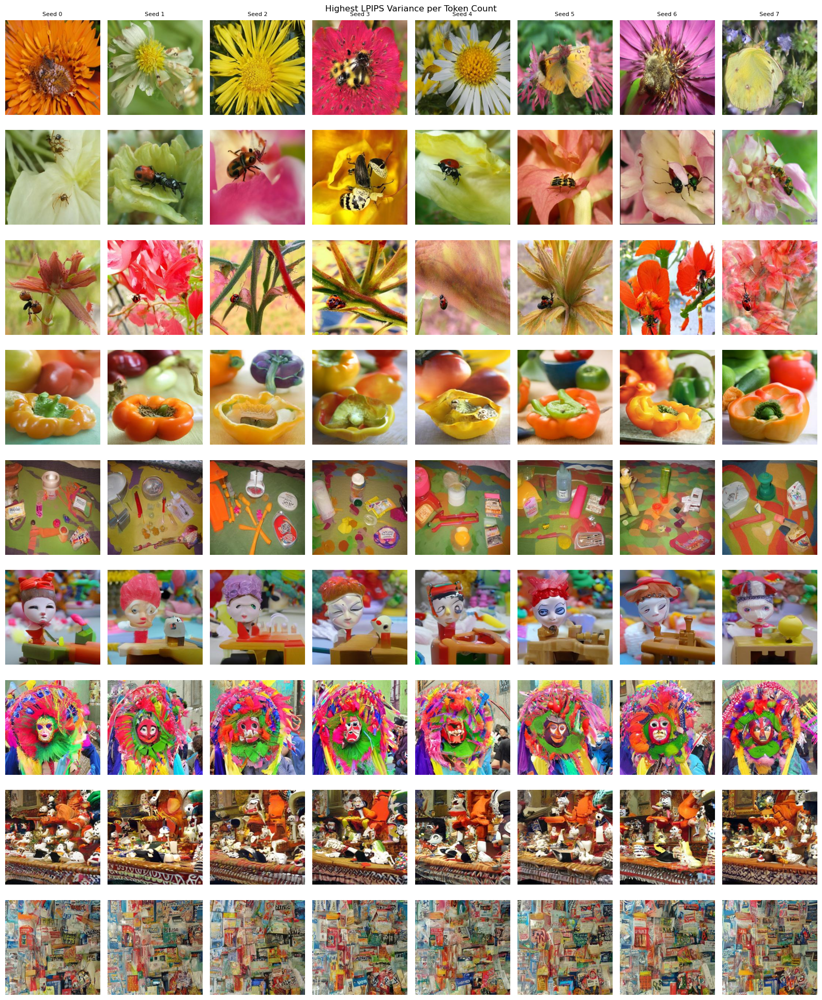

In [10]:
fig = plot_all_extremes_combined(variance_data, k_values, extreme_type="highest")
fig.savefig(
    "/BS/data_mani_compress/work/thesis/thesis/output/extreme_variance_highest_all_k.pdf",
    bbox_inches="tight",
)
plt.show()

/tmp/ipykernel_1914317/3673140571.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(


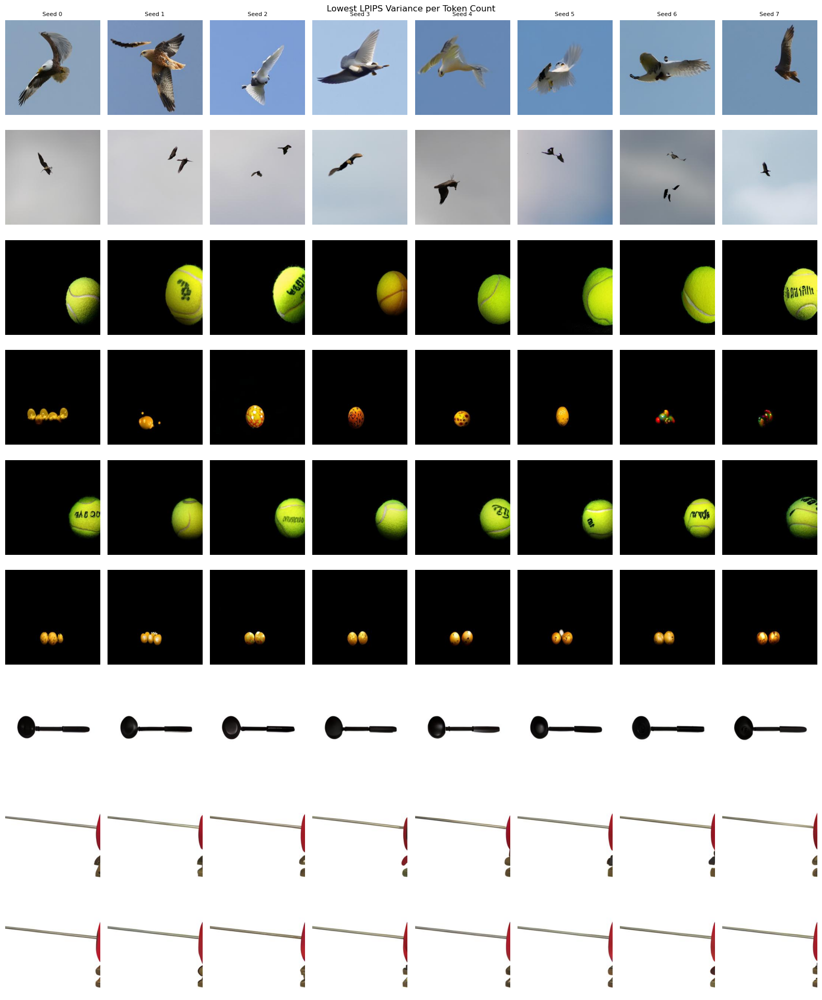

In [11]:
fig = plot_all_extremes_combined(variance_data, k_values, extreme_type="lowest")
fig.savefig(
    "/BS/data_mani_compress/work/thesis/thesis/output/extreme_variance_lowest_all_k.pdf",
    bbox_inches="tight",
)
plt.show()